In [33]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import rc_context
sc.settings.verbosity = 1

#sc.logging.print_versions()

import os 
import sys
import gc
import importlib

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['font.sans-serif'] = 'Arial'
sc.set_figure_params(dpi=50, dpi_save=300, vector_friendly=True)
sns.set_style('white', {'axes.grid' : False})


def vector(on=False):
    if on:
        sc.set_figure_params(dpi=50, dpi_save=300, vector_friendly=False)
    else:
        sc.set_figure_params(dpi=50, dpi_save=300, vector_friendly=True)
vector(False)

In [3]:
def gem2adata(in_put, binsize, stereopy=False, in_type='file', sep='\t'):
    import scipy.sparse as sps
    if in_type == 'file':
        df = pd.read_csv(in_put, comment='#', sep=sep)
    if in_type == 'df':
        df = in_put.copy()
    if not stereopy:
        df['x'] = df['x'].apply(lambda x: int(x/binsize)*binsize)
        df['y'] = df['y'].apply(lambda x: int(x/binsize)*binsize)
    if stereopy:
        df = stereopy_merge(df, binsize=binsize)
        
    df['index'] = df['x'].apply(str) + '_' + df['y'].apply(str) + '@' + df['geneID']
    try:
        df = df[['index', 'MIDCounts']]
    except:
        df = df[['index', 'MIDCount']]
    
    df.columns = ['index', 'MIDCounts']

    df = df.groupby('index').sum()

    df[['index', 'geneID']] = [x.split('@') for x in df.index]
    index = df['index'].unique()
    idict = dict(zip(index, range(len(index))))
    geneID = df['geneID'].unique()
    gdict = dict(zip(geneID, range(len(geneID))))

    df['index'] = df['index'].apply(lambda x: idict[x])
    df['geneID'] = df['geneID'].apply(lambda x: gdict[x])

    csr_matrix = sps.csr_matrix((df['MIDCounts'].values, (df['index'].values, df['geneID'].values)), shape=(len(index), len(geneID)))
    adata = sc.AnnData(csr_matrix)
    adata.obs[['x', 'y']] = [x.split('_') for x in index]
    adata.obs[['x', 'y']] = adata.obs[['x', 'y']].applymap(int)
    adata.obs_names = ['DNB_' + x for x in index]
    adata.var_names = geneID
    adata.obsm['spatial'] = adata.obs[['x', 'y']].values
    return adata

def reloc(adata, arrange='v', cat=None):
    loc = adata.obs[['x','y']].astype(float).copy()
    adata.obs['sample'] = adata.obs['sample'].astype('category')
    if cat is not None:
        adata.obs['sample'] = pd.Categorical(adata.obs['sample'], categories=cat)
    for slide in adata.obs['sample'].cat.categories:
        tmp = loc.loc[adata.obs_names[adata.obs['sample'] == slide], :].copy()
        x_range, y_range = tmp.max() - tmp.min()
        if (arrange=='v') & (x_range >= y_range):
            tmp[['x', 'y']] = tmp[['y', 'x']].to_numpy()
        if (arrange=='h') & (x_range < y_range):
            tmp[['x', 'y']] = tmp[['y', 'x']].to_numpy()
            
        x_mean = int(tmp['x'].mean())
        y_mean = int(tmp['y'].mean())
        loc.loc[tmp.index, 'x'] = tmp['x'].values - x_mean
        loc.loc[tmp.index, 'y'] = tmp['y'].values - y_mean

    #adata.obsm['X_umap_bak'] = adata.obsm['X_umap']
    adata.obsm['X_umap'] = loc.to_numpy()

    x_edge = 0
    for sample in adata.obs['sample'].cat.categories:
        tmp = adata[adata.obs['sample']==sample, :]
        r = (tmp.obsm['X_umap'][:, 0].max() - tmp.obsm['X_umap'][:, 0].min())/2
        loc.loc[tmp.obs_names, 'x'] = loc.loc[tmp.obs_names, 'x'] + x_edge + r + 1000
        x_edge = loc.loc[tmp.obs_names, 'x'].max()
    loc = loc - loc.min()
    adata.obsm['X_umap'] = loc.to_numpy()
    adata.obsm['spatial'] = loc.to_numpy()

def sc_qc(adata, min_genes=0, max_genes=0, mt_pct=0, min_cells=0, sc_cal=True, sc_filter=True):
    if sc_cal:
        adata.var['mt'] = adata.var_names.str.startswith('mt-')
        adata.var['rp'] = adata.var_names.str.startswith('Rpl') | adata.var_names.str.startswith('Rps')
        if adata.var['mt'].sum() == 0:
            adata.var['mt'] = adata.var_names.str.startswith('MT-')
            adata.var['rp'] = adata.var_names.str.startswith('RPL') | adata.var_names.str.startswith('RPS')
        sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
        sc.pp.calculate_qc_metrics(adata, qc_vars=['rp'], percent_top=None, log1p=False, inplace=True)
        
    if sc_filter:
        if min_genes > 0:
            sc.pp.filter_cells(adata, min_genes=min_genes)
        if max_genes > 0:
            sc.pp.filter_cells(adata, max_genes=max_genes)
        
        if mt_pct > 0:    
            adata = adata[adata.obs.pct_counts_mt <= mt_pct, :]
        if min_cells > 0:
            sc.pp.filter_genes(adata, min_cells=min_cells)
    
    return adata

def del_mt_rp(adata):
    var_names = adata.var_names[~(adata.var['mt'] | adata.var['rp'])]
    var_names = var_names[~var_names.isin([x for x in var_names if '.' in x])]
    return adata[:, var_names]

    
def singlet_rm(adata, binsize, radius, cutoff=None):
    if cutoff is None:
        cutoff = radius**2
    from sklearn.neighbors import radius_neighbors_graph
    radius = radius * binsize
    con = radius_neighbors_graph(adata.obsm['spatial'], radius=radius, include_self=False)

    counts = np.array(con.sum(axis=1))[:, 0]
    return adata[counts>cutoff, :]

def cal_moran(adata, n_jobs=1, use_raw=False, genes=None, **kwds):
    import squidpy as sq
    sq.gr.spatial_neighbors(adata, coord_type='grid')    
    if genes is None:
        genes = list(adata.var_names)
    sq.gr.spatial_autocorr(adata, n_jobs=n_jobs, mode='moran', use_raw=use_raw, genes=genes, **kwds)

def loc_plot(adata, groupby='leiden', mode='umap', binsize=80, keep=False, **kwds):

    
    clist = list()
    try:
        for i in adata.obs[groupby].cat.categories:
            cname = 'cluster' + str(i)
            adata.obs[cname] = (adata.obs[groupby].isin([i])).apply(int)
            clist.append(cname)
        clist.append(groupby)
    except:
        for i in adata.obs[groupby].unique():
            cname = 'cluster' + str(i)
            adata.obs[cname] = (adata.obs[groupby].isin([i])).apply(int)
            clist.append(cname)
        clist.append(groupby)
        
    #clist = ['cluster' + str(x) for x in adata.obs['cluster'].unique()]
    if mode == 'umap':
        sc.pl.umap(adata, color=clist, **kwds)
    if mode == 'spatial':
        # marker_plot(adata, markers=clist, **kwds)
        sc.pl.spatial(adata, color=clist, basis='spatial', **kwds)
    if mode == 'marker':
        marker_plot(adata, markers=clist, **kwds)

    
    if not keep:
        clist.pop(-1)
        adata.obs.drop(clist, axis=1, inplace=True)

# QC

In [3]:
sample_dict = dict({"Y00583N9": "WL202406200098",
                    "Y00583N8": "WL202406200097",
                    "Y00583F1": "WL202406200096",
                    "Y00583F6": "WL202406200084",
                    "Y00583N2": "WL202406200079",
                    "Y00583N6": "WL202406200070",
                    "Y00583MA": "WL202406200068",
                    "Y00583M8": "WL202406200020"})

time_dict = dict({"Y00583M8": "nomal",
                    "Y00583MA": "normal",
                    "Y00583N2": "8w",
                    "Y00583N6": "8w",
                    "Y00583F6": "4W",
                    "Y00583F1": "4W",
                    "Y00583N8": "1D",
                    "Y00583N9": "1D",})
sample_dict.keys()

dict_keys(['Y00583N9', 'Y00583N8', 'Y00583F1', 'Y00583F6', 'Y00583N2', 'Y00583N6', 'Y00583MA', 'Y00583M8'])

In [9]:
files = os.popen('ls gef/*gef').read().split('\n')[:-1]
blist = list()

for file in files:
    sample = os.path.basename(file).split('.')[0]
    data = st.io.read_gef(file_path=file, bin_size=50)
    data.tl.raw = data
    adata = st.io.stereo_to_anndata(data, flavor='scanpy')
    adata.obs['sample'] = sample
    
    adata.obs_names = [sample +'@' + x for x in adata.obs_names]
    blist.append(adata)

[2025-02-13 18:08:37][Stereo][3403693][MainThread][140071613343552][reader][897][INFO]: read_gef begin ...
[2025-02-13 18:08:37][Stereo][3403693][MainThread][140071613343552][reader][984][INFO]: the matrix has 19476 cells, and 44638 genes.
[2025-02-13 18:08:37][Stereo][3403693][MainThread][140071613343552][reader][992][INFO]: read_gef end.
[2025-02-13 18:08:37][Stereo][3403693][MainThread][140071613343552][reader][659][INFO]: Adding sample in adata.obs['orig.ident'].
[2025-02-13 18:08:38][Stereo][3403693][MainThread][140071613343552][reader][662][INFO]: Adding data.position as adata.obsm['spatial'] .
[2025-02-13 18:08:38][Stereo][3403693][MainThread][140071613343552][reader][667][INFO]: Adding data.position as adata.obs['x'] and adata.obs['y'] .
[2025-02-13 18:08:38][Stereo][3403693][MainThread][140071613343552][reader][763][INFO]: Adding data.tl.raw.exp_matrix as adata.raw .
[2025-02-13 18:08:38][Stereo][3403693][MainThread][140071613343552][reader][796][INFO]: Finished conversion to 

In [11]:
blist[1].obs

,orig.ident,x,y,sample
tb_1D_2@31138512910400,sample,7250,14400,tb_1D_2
tb_1D_2@35862976935850,sample,8350,14250,tb_1D_2
tb_1D_2@41016937692300,sample,9550,15500,tb_1D_2
tb_1D_2@42305427879300,sample,9850,13700,tb_1D_2
tb_1D_2@42305427880500,sample,9850,14900,tb_1D_2
...,...,...,...,...
tb_1D_2@43164421335350,sample,10050,10550,tb_1D_2
tb_1D_2@44452911530300,sample,10350,16700,tb_1D_2
tb_1D_2@46385646807300,sample,10800,10500,tb_1D_2
tb_1D_2@56908316681850,sample,13250,9850,tb_1D_2


In [8]:
time_dict = dict({"Y00583M8": "nomal",
                    "Y00583MA": "normal",
                    "Y00583N2": "8w",
                    "Y00583N6": "8w",
                    "Y00583F6": "4W",
                    "Y00583F1": "4W",
                    "Y00583N8": "1D",
                    "Y00583N9": "1D",})

for i, chip in enumerate(sample_dict.keys()):
    blist[i].obs['time'] = time_dict[chip]

... storing 'sample' as categorical


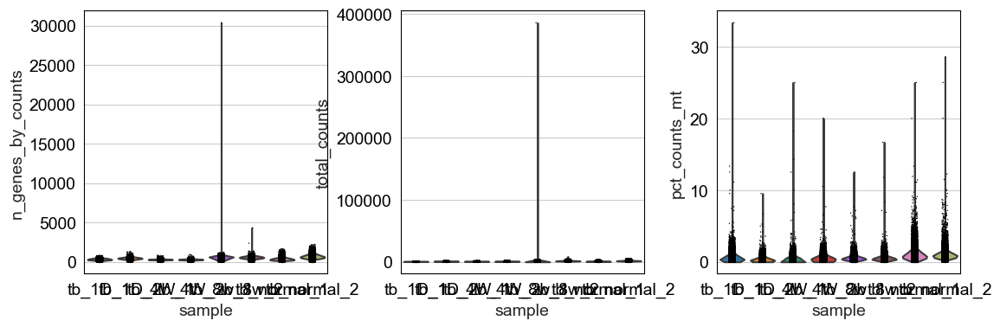

In [12]:
adata = sc.concat(blist, join='outer')
sc_qc(adata, sc_filter=False)
sc.pl.violin(adata, groupby='sample', keys=['n_genes_by_counts', 'total_counts', 'pct_counts_mt'])

In [15]:
cat = ['tb_normal_1', 'tb_normal_2', 'tb_1D_1', 'tb_1D_2', 'tb_4W_1', 'tb_4W_2', 'tb_8w_1', 'tb_8w_2' ]
adata.obs['sample'] = pd.Categorical(adata.obs['sample'], categories=cat)

/tmp/ipykernel_3403693/1988941677.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['sample'] = pd.Categorical(adata.obs['sample'], categories=cat)


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern pruned
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'D', 'W', 'a', 'b', 'c', 'e', 'eight', 'five', 'four', 'g', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'w', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 27, 39, 58, 66, 68, 69, 70, 72, 74, 79, 80, 81, 82, 83, 85, 86, 87, 88, 90, 92]
INFO:fontTools.subset:Closed glyph list over 'GSUB': 31 glyphs after
INFO:font

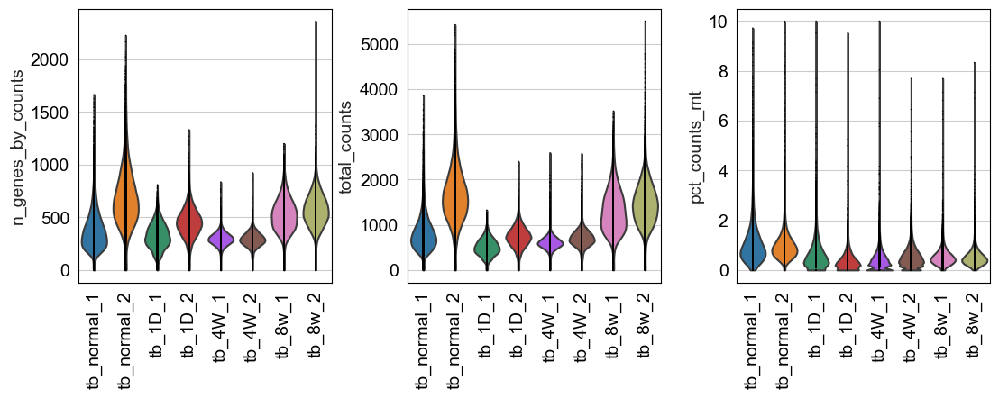

In [20]:
adata = adata[adata.obs['n_genes_by_counts']<=4000]
adata = adata[adata.obs['pct_counts_mt']<=10]
sc.pl.violin(adata, groupby='sample', keys=['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=False, rotation=90, save='qc.pdf')

In [18]:
adata.obs_names = adata.obs['sample'].astype(str) + '@' + adata.obs['x'].astype(str) + '_' + adata.obs['y'].astype(str)

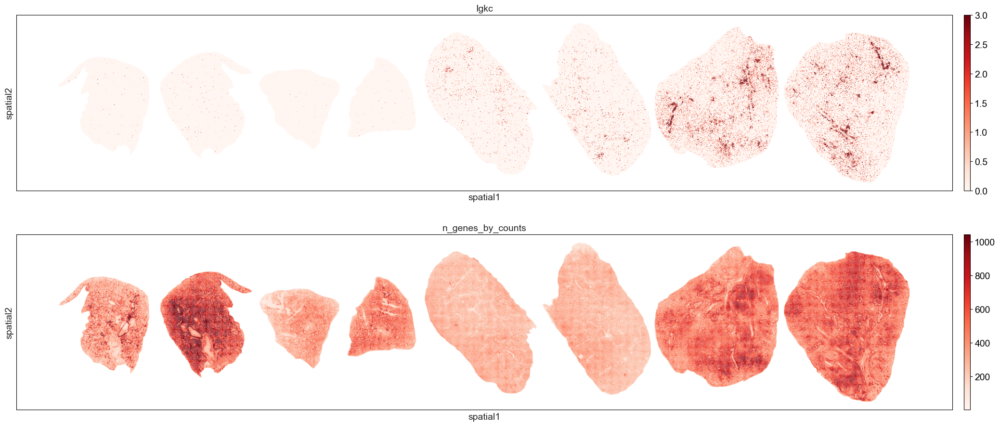

In [19]:
reloc(adata, cat=cat)
with rc_context(rc={'figure.figsize': (30,5)}): 
    sc.pl.spatial(adata, color=['Igkc', 'n_genes_by_counts'], cmap='Reds', vmax='p99', ncols=1, spot_size=60)

In [21]:
adata = sc_qc(adata, min_genes=100)
adata.write('tb_bin50_raw.h5ad')
# adata = sc.read_h5ad('tb_bin50_raw.h5ad')

In [22]:
adata.layers['counts'] = adata.X.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

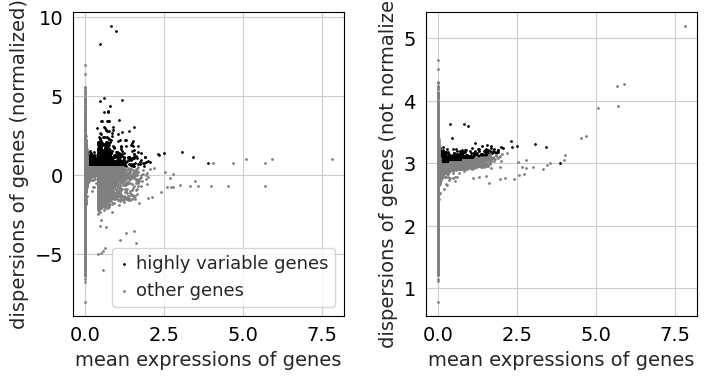

4412


In [17]:
sc.pp.highly_variable_genes(adata, min_disp=0.5, min_mean=0.05, max_mean=4)
sc.pl.highly_variable_genes(adata)
print(adata.var['highly_variable'].sum())

In [23]:
def hvg_by_sample(adata, groupby='sample', min_disp=0.8, min_mean=0.05, max_mean=3):
    hvg = list()
    for data in adata.obs[groupby].unique():
        tmp = adata[adata.obs[groupby]==data]
        sc.pp.highly_variable_genes(tmp, flavor="seurat", min_disp=min_disp, min_mean=min_mean, max_mean=max_mean)
        count = tmp.var['highly_variable'].sum()
        print(f'{data}: {count}')
        sc.pl.highly_variable_genes(tmp)
        hvg.append(tmp.var_names[tmp.var['highly_variable']].to_list())

    hvg2 = set(hvg[0])
    for tmp in hvg[1:]:
        hvg2 = hvg2 | set(tmp)
    hvg = list(hvg2)

    adata.var['highly_variable'] = False
    adata.var.loc[hvg, 'highly_variable'] = True
    print(f'total hvg: {len(hvg)}')

/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:539: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': flavor}


tb_1D_1: 2478


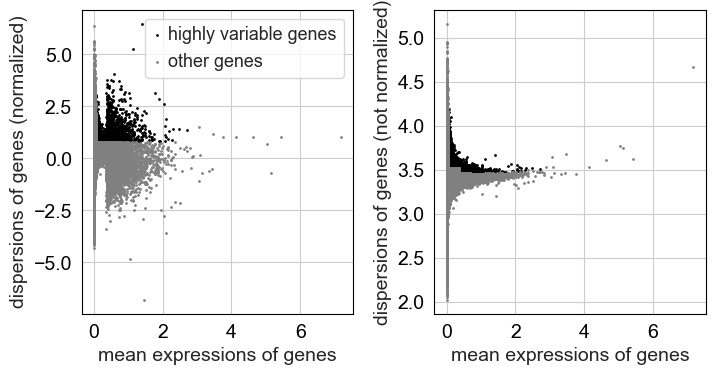

/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:539: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': flavor}


tb_1D_2: 2278


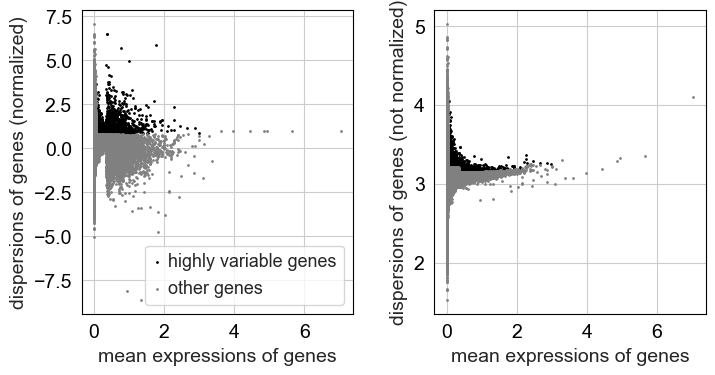

/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:539: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': flavor}


tb_4W_1: 1336


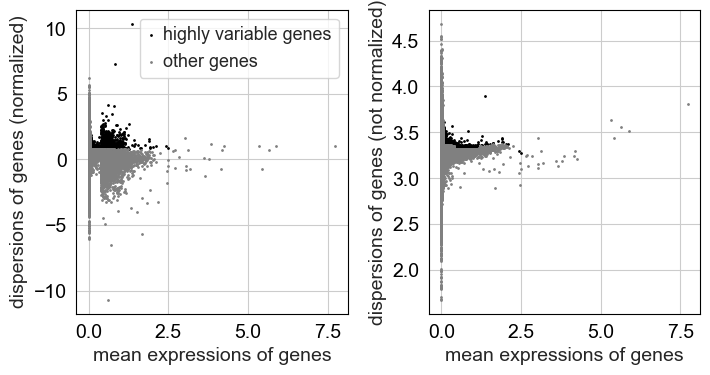

/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:539: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': flavor}


tb_4W_2: 1156


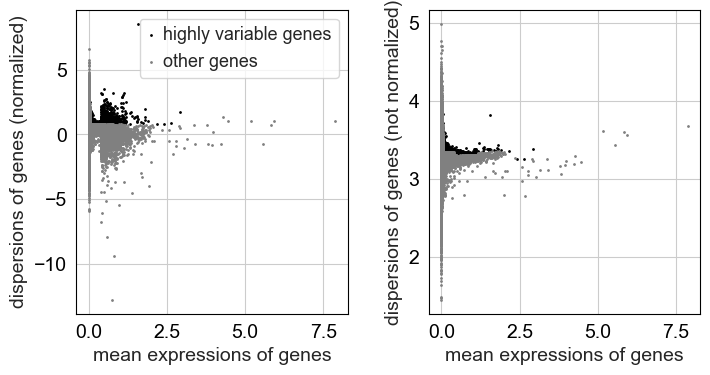

/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:539: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': flavor}


tb_8w_1: 739


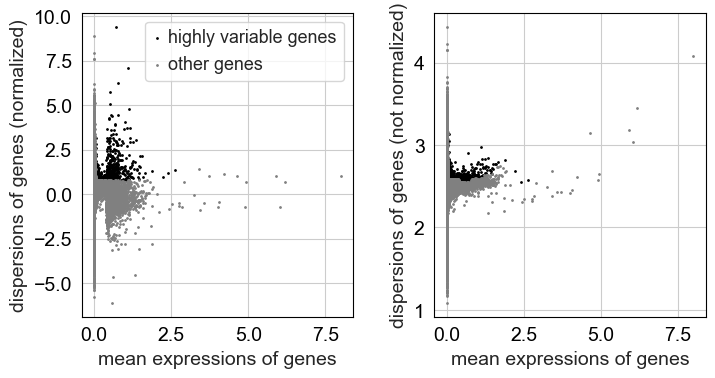

/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:539: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': flavor}


tb_8w_2: 756


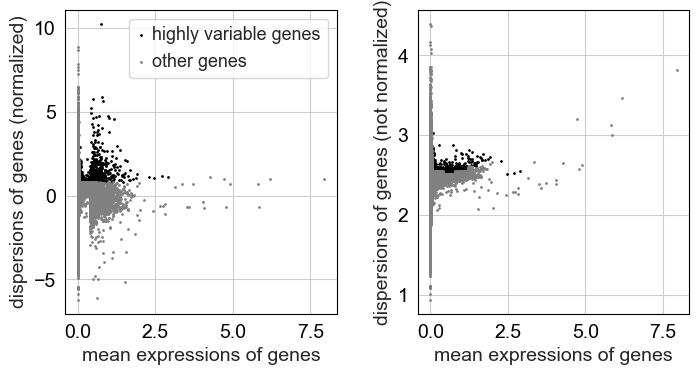

/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:539: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': flavor}


tb_normal_1: 2083


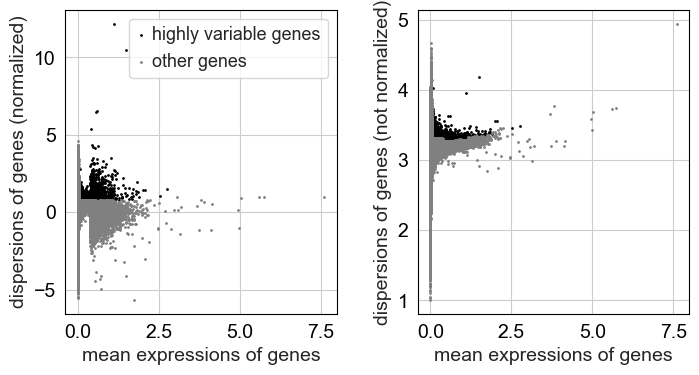

/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:539: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': flavor}


tb_normal_2: 1424


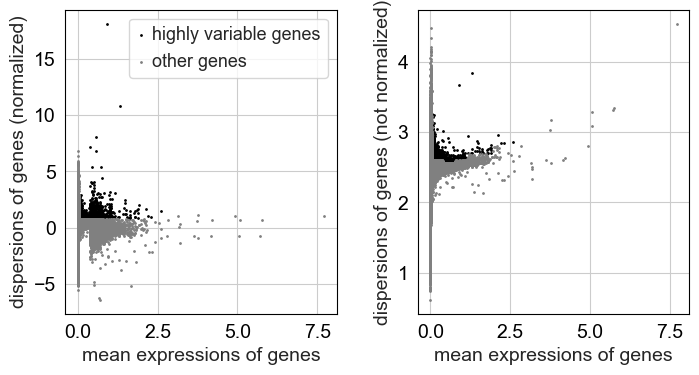

total hvg: 8465


In [24]:
min_disp=0.8
min_mean=0.05
max_mean=3

hvg_by_sample(adata, groupby='sample', min_disp=min_disp, min_mean=min_mean, max_mean=max_mean)

In [30]:
adata.raw = adata
adata = del_mt_rp(adata)
adata = adata[:, adata.var['highly_variable']]
adata

View of AnnData object with n_obs × n_vars = 308721 × 8445
    obs: 'orig.ident', 'x', 'y', 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'n_genes'
    var: 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
    uns: 'sample_colors', 'log1p'
    obsm: 'spatial', 'X_umap'
    layers: 'counts'

In [32]:
alist = list()
for data in adata.obs['sample'].unique():
    tmp = adata[adata.obs['sample']==data].copy()
    cal_moran(tmp,n_jobs=16)
    tmp.uns['moranI'].to_csv(f'moranI/{data}_moran.csv')
    alist.append(tmp)

/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/scanpy/metrics/_gearys_c.py:293: UserWarning: 2 variables were constant, will return nan for these.
  warnings.warn(
/home/lee/miniconda3/envs/stereopy/lib/python3.8/site-packages/scanpy/metrics/_gearys_c.py:293: UserWarning: 1 variables were constant, will return nan for these.
  warnings.warn(


In [ ]:
mlist = [alist[i].uns['moranI'].index[(alist[i].uns['moranI']['I']>=0.01)] for i in range(len(alist))]
mset = set()
for geneset in mlist:
    mset = mset | set(geneset)
hvg = list(mset)  
len(hvg)


In [27]:
adata = adata.raw.to_adata()
adata.raw = adata

In [28]:
adata = del_mt_rp(adata)
hvg = set(hvg) & set(adata.var_names)
hvg = list(hvg)
len(hvg)

2794

In [29]:

adata.var['highly_variable'] = False
adata.var.loc[hvg, 'highly_variable'] = True
adata = adata[:, adata.var['highly_variable']]

Trying to set attribute `.var` of view, copying.


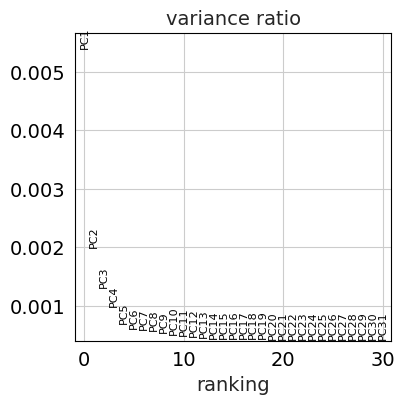

In [30]:
adata = adata[:, adata.var['highly_variable']]
sc.pp.scale(adata)
sc.pp.pca(adata)
sc.pl.pca_variance_ratio(adata)

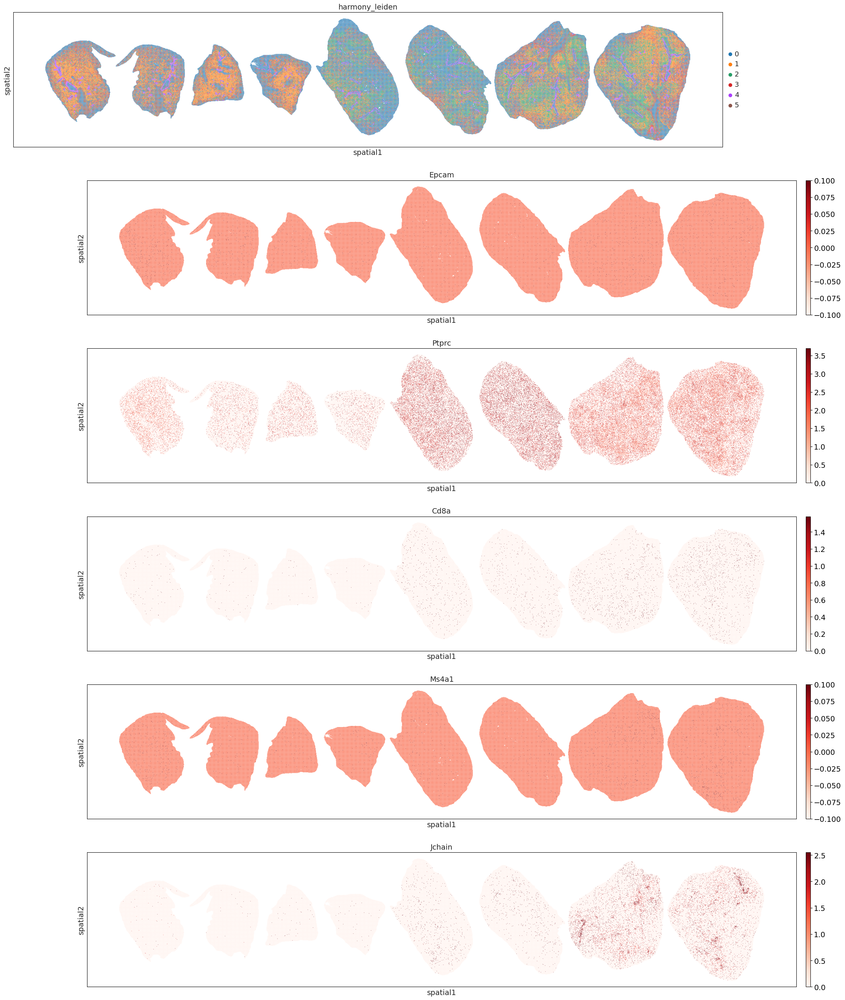

In [34]:
sc.external.pp.harmony_integrate(adata, key='sample')

n_neighbors=40
n_pcs=15
res=0.8

sc.pp.neighbors(adata, n_neighbors=n_neighbors, use_rep='X_pca_harmony')

sc.tl.leiden(adata, resolution=res, key_added='harmony_leiden')
with rc_context(rc={'figure.figsize': (30,5)}):                   
    sc.pl.spatial(adata, color=['harmony_leiden', 'Epcam', 'Ptprc', 'Cd8a', 'Ms4a1', 'Jchain'], cmap='Reds', vmax='p99', ncols=1, spot_size=50)

In [31]:
def deg(adata, groupby='leiden', groups='all', reference='rest', method='wilcoxon', save=None, use_raw=True, **kwds):
    sc.tl.rank_genes_groups(adata, groupby=groupby, method='wilcoxon', use_raw=use_raw, reference=reference, groups=groups, **kwds)
    result = adata.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    df = pd.DataFrame(
            {group + '_' + key: result[key][group]
             for group in groups for key in ['names', 'logfoldchanges','pvals_adj']})
    if save:
        df.to_csv(save, sep='\t')
    return df

def degenes(deg, ntop):
    df = deg.head(ntop).loc[:, ['names' in x for x in deg.columns]]
    return df.T.values.reshape(-1)

In [32]:
degs = deg(adata, groupby='harmony_leiden', use_raw=True)
degs.to_csv('hvg_bin50.csv')

In [ ]:
adata.write('tb_bin50_harmony_leiden.h5ad')

# smooth

In [4]:
def smooth(adata, num_nbrs=30, num_samples=10, xkey='x', ykey='y', num_drop=None,
           subsample=False, use_highly_variable=False, use_spatially_variable=False, use_rep=None, sigma = None):

    # Find nbrhds
    from sklearn.neighbors import NearestNeighbors
    coordinates = adata.obsm["spatial"]    
    nbrs = NearestNeighbors(n_neighbors=num_nbrs)
    nbrs.fit(coordinates)
    _, nbr_idxs = nbrs.kneighbors(coordinates)

    # Subsample nbrhds
    if num_drop:
        nbr_idxs_sampled = nbr_idxs[:,num_drop:]
    elif subsample:
        nbr_idxs_sampled = [np.random.choice(idxs, size=num_samples) for idxs in nbr_idxs]
    else:
        nbr_idxs_sampled = nbr_idxs

    # Isolate highly/spatially variable genes
    if use_rep is not None:
        X = adata.obsm[use_rep]
    elif use_highly_variable:
        X = adata.X[:, adata.var['highly_variable']]
    elif use_spatially_variable:
        X = adata.X[:, adata.var['spatially_variable']]
    else:
        #X = adata.obsm['scvi_CT_I']
        X = adata.obsm['X_pca']
    # Concatenate nbr vectors
    X_smooth = []
    for nth_nbrs in np.array(nbr_idxs_sampled).T:
        X_smooth.append(X[nth_nbrs])
    X_smooth = np.hstack(X_smooth)
    if sigma:
        X_smooth = gaussian_filter1d(X_smooth, sigma=sigma, axis=1)
    return X_smooth

In [5]:
adata = sc.read_h5ad('tb_bin50_harmony_leiden.h5ad')

In [6]:
adata.obs['x2'] = adata.obsm['spatial'][:, 0]
adata.obs['y2'] = adata.obsm['spatial'][:, 1]

xkey='x2'
ykey='y2'
batch_key='sample'
num_drop=False
use_highly_variable=False
use_rep = 'X_pca_harmony'
num_hvgs=None
subsample=True
use_spatially_variable=False
svg_method='moran'
num_genes=1000
region_key = "top_region_cluster"

num_nbrs=20
num_samples = 10

X_smooth = []
X_smooth.append(smooth(adata,
           num_nbrs=num_nbrs,
           num_samples=num_samples,
           xkey=xkey,
           ykey=ykey,
           use_highly_variable=use_highly_variable,
           use_spatially_variable=use_spatially_variable,
           use_rep=use_rep,
           num_drop=num_drop,
           subsample=subsample
            ))
X_smooth = np.vstack(X_smooth)


In [ ]:
from sklearn.decomposition import PCA
svd_solver='randomized'
pca_key='X_pca_harmony_smooth'
num_pcs=20
pca = PCA(n_components=num_pcs, svd_solver=svd_solver)
adata.obsm[pca_key] = pca.fit_transform(X_smooth)

region_key = "top_region_cluster"

sc.pp.neighbors(adata, use_rep=pca_key, key_added=region_key)
sc.tl.leiden(adata, resolution = 0.8, key_added=region_key, neighbors_key=region_key)

In [13]:
adata.write('tb_bin50_harmony_smooth.h5ad')

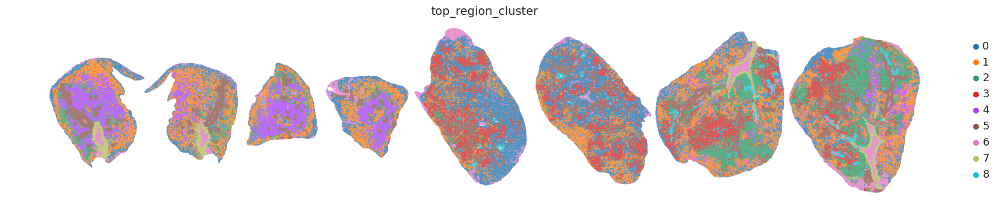

In [14]:
with rc_context(rc={'figure.figsize': (30, 4)}):
    sc.pl.spatial(adata, color=['top_region_cluster'], basis='spatial', spot_size=60, frameon=False)

# annotation

In [2]:
adata = sc.read_h5ad('tb_bin50_harmony_smooth.h5ad')
adata

AnnData object with n_obs × n_vars = 308721 × 2794
    obs: 'total_counts', 'pct_counts_mt', 'n_genes_by_counts', 'orig.ident', 'x', 'y', 'sample', 'chip', 'time', 'total_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'n_genes', 'harmony_leiden', 'x2', 'y2', 'top_region_cluster', 'leiden'
    var: 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'harmony_leiden_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'top_region_cluster', 'top_region_cluster_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_pca_harmony_smooth', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'top_region_cluster_connectivities', 'top_region_cluster_distances'

In [3]:
adata = adata.raw.to_adata()
adata.obs

,total_counts,pct_counts_mt,n_genes_by_counts,orig.ident,x,y,sample,chip,time,total_counts_mt,total_counts_rp,pct_counts_rp,n_genes,harmony_leiden,x2,y2,top_region_cluster,leiden
Y00583N9@7250_14400,523.0,0.382409,301,sample,7250,14400,Y00583N9,Y00583N9,1D,2.0,0.0,0.0,301,3,25720.0,4364.0,0,0
Y00583N9@8350_14250,1357.0,0.221076,805,sample,8350,14250,Y00583N9,Y00583N9,1D,3.0,0.0,0.0,805,1,25570.0,5464.0,5,4
Y00583N9@9550_15500,716.0,0.279330,444,sample,9550,15500,Y00583N9,Y00583N9,1D,2.0,0.0,0.0,444,3,26820.0,6664.0,4,1
Y00583N9@9850_13700,925.0,0.108108,565,sample,9850,13700,Y00583N9,Y00583N9,1D,1.0,0.0,0.0,565,2,25020.0,6964.0,2,2
Y00583N9@9850_14900,296.0,0.000000,185,sample,9850,14900,Y00583N9,Y00583N9,1D,0.0,0.0,0.0,185,0,26220.0,6964.0,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Y00583M8@10150_13300,285.0,0.701754,139,sample,10150,13300,Y00583M8,Y00583M8,nomal,2.0,0.0,0.0,139,0,16257.0,6838.0,0,0
Y00583M8@7500_10400,324.0,2.469136,133,sample,7500,10400,Y00583M8,Y00583M8,nomal,8.0,0.0,0.0,133,0,13357.0,4188.0,0,0
Y00583M8@9950_12900,268.0,0.746269,123,sample,9950,12900,Y00583M8,Y00583M8,nomal,2.0,0.0,0.0,123,0,15857.0,6638.0,6,0
Y00583M8@7250_10500,395.0,0.759494,131,sample,7250,10500,Y00583M8,Y00583M8,nomal,3.0,0.0,0.0,131,0,13457.0,3938.0,0,0


In [4]:
deg = deg(adata, groupby='top_region_cluster', use_raw=True)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:28:41)


In [7]:
deg.head(50).to_csv('deg.csv')

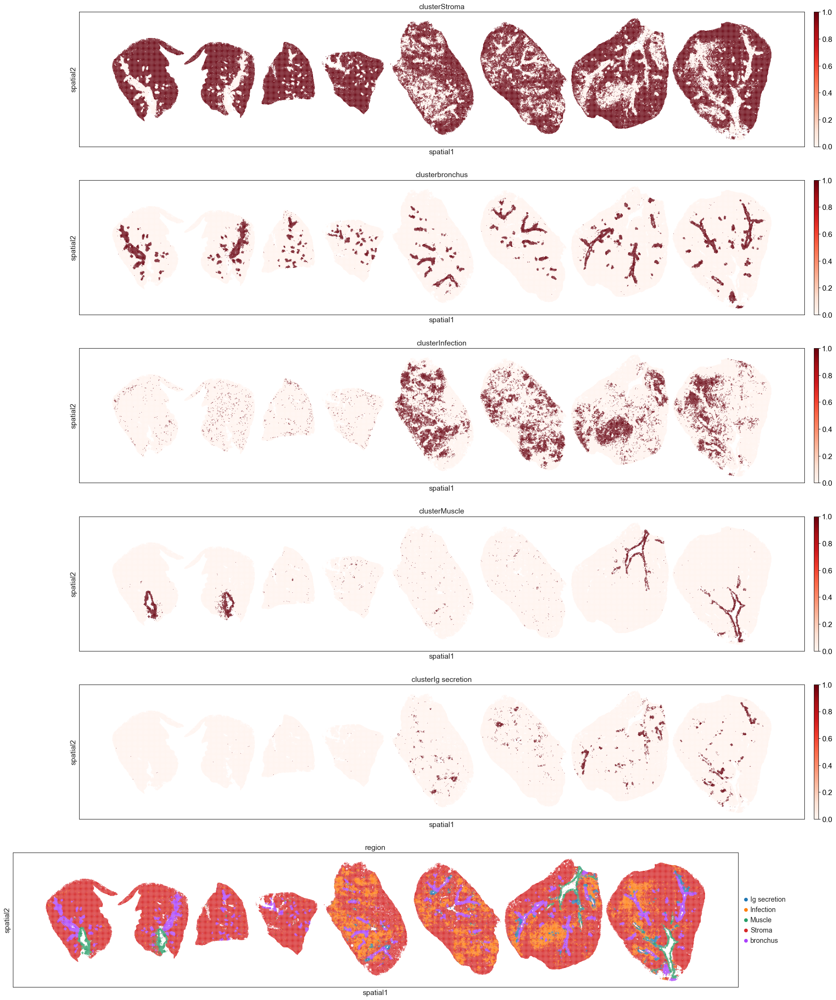

In [21]:
annotation = dict({"0": "Stroma",
                "1": "Stroma",
                "2": "Stroma",
                "3": "Infection",
                "4": "Stroma",
                "5": "bronchus",
                "7": "Muscle",
                "8": "Ig secretion",})

tmp.obs['region'] = [annotation[x] for x in tmp.obs['top_region_cluster'].astype(str)]
with rc_context(rc={'figure.figsize': (30, 5)}):
    loc_plot(tmp, groupby='region', mode='spatial', spot_size=60, cmap='Reds', ncols=1)

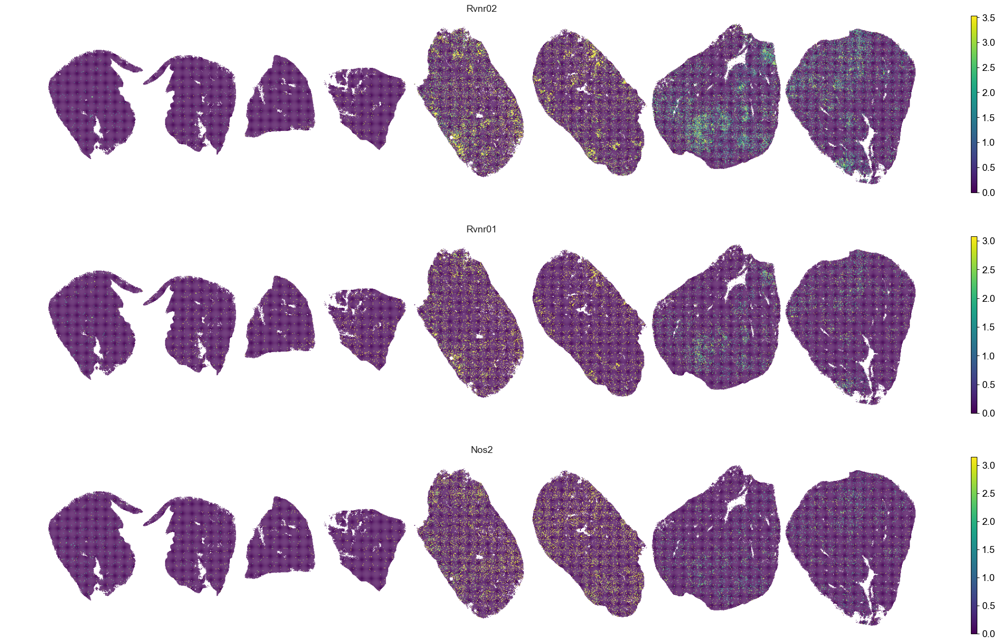

In [66]:
with rc_context(rc={'figure.figsize': (30, 5)}):
    sc.pl.spatial(tmp, color=['Rvnr02', 'Rvnr01', 'Nos2'], spot_size=60, cmap='viridis', ncols=1, vmax='p99',frameon=False, save='infect_markers.pdf')

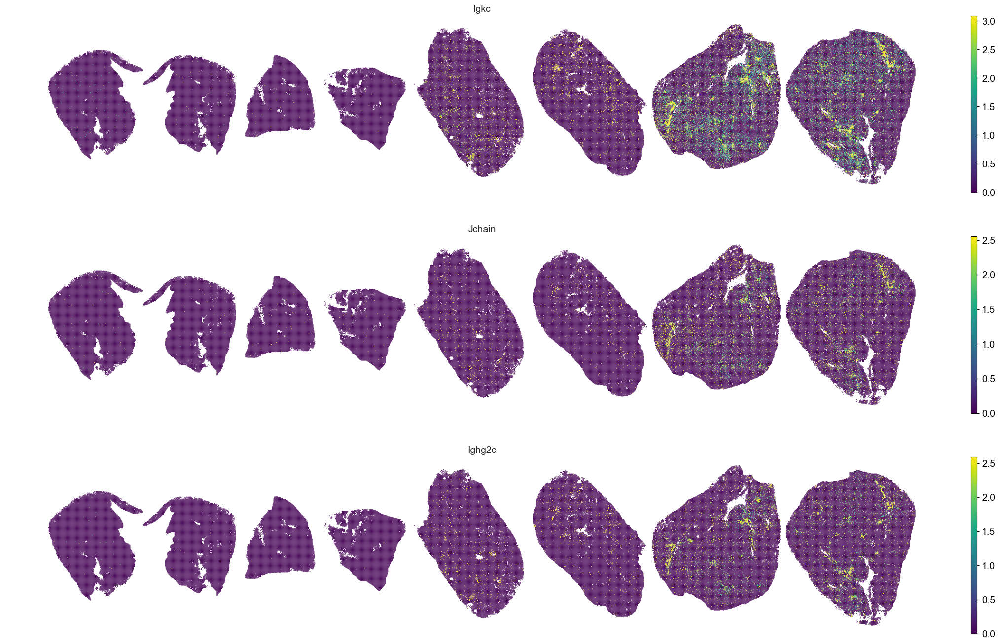

In [63]:
with rc_context(rc={'figure.figsize': (30, 5)}):
    sc.pl.spatial(tmp, color=['Igkc', 'Jchain', 'Ighg2c'], spot_size=60, cmap='viridis', ncols=1, vmax='p99', frameon=False, save='ig_markers.pdf')

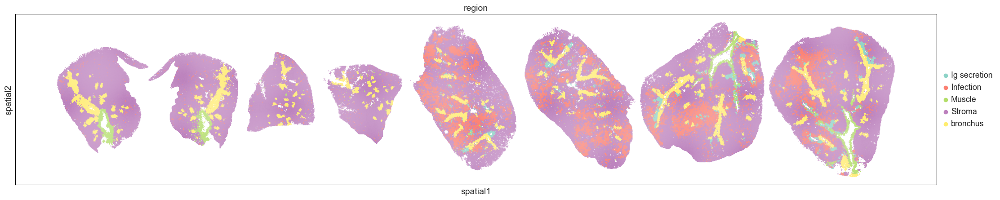

In [48]:
with rc_context(rc={'figure.figsize': (30, 5)}):
    sc.pl.spatial(tmp, color='region', spot_size=60, palette='Set3', ncols=1, vmax='p99')

In [49]:
color_bak = tmp.uns['region_colors'].copy()

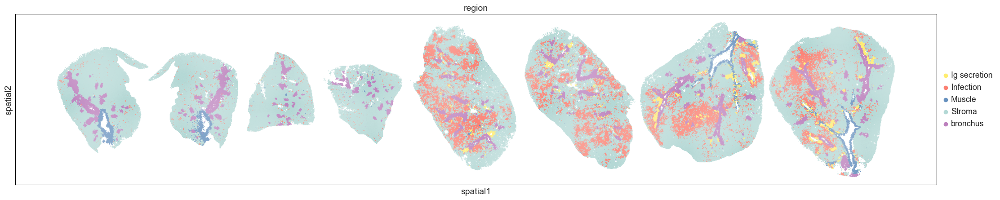

In [56]:
color = color_bak.copy()
color[0] = color[4]
color[3] = '#B3D8D5'
color[4] = color_bak[3]
# color[2] = '#83ccd8'
color[2] = '#6791bf'
with rc_context(rc={'figure.figsize': (30, 5)}):
    sc.pl.spatial(tmp, color='region', spot_size=60, palette=color, ncols=1, vmax='p99', save='cluster.pdf')

In [84]:
tmp.write('tb_bin50_harmony_smooth_rmlow.h5ad')

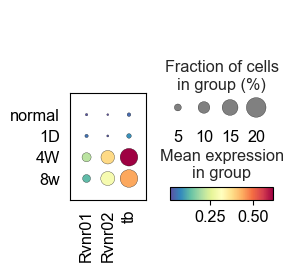

In [79]:
rv = [x for x in tmp.var_names if x.startswith('Rv')]
tmp.obs.loc[tmp.obs['time']=='nomal', 'time'] = 'normal'
tmp.obs['time'] = pd.Categorical(tmp.obs['time'].astype(str), categories=['normal', '1D', '4W', '8w'])
tmp.obs['tb'] = tmp[:, rv].to_df().sum(axis=1).values
sc.pl.dotplot(tmp, var_names=['Rvnr01', 'Rvnr02', 'tb'], groupby='time', cmap='Spectral_r',categories_order=['normal', '1D', '4W', '8w'], save='tb.pdf', )